# PCA Analysis (even dubbelop als APK Keuring)

Met dank aan Bert Wouters natuurlijk :).

Wat linkjes:
https://mailman.ucar.edu/pipermail/ncl-talk/2020-May/016913.html


In [3]:
import xarray as xr
import matplotlib.pyplot as plt
import os
import numpy as np
import unixFunctionsMITgcm_final as fc

### Initialisation

In [3]:
filename='new2_amundsen_shelf_temp_200to700'
var='THETA'

members='all'
window=24

### Read Data

In [25]:
data=fc.loadMITgcmData(filename=filename, members=members)
data_dt=fc.detrend_and_average_MITgcmData(data, var, window=window)

Loading number:0
Loading number:1


/tmp/ipykernel_73388/2941676426.py:12: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  data['time']=data.indexes['time'].to_datetimeindex()


(2210, 384, 600)
(10, 384, 600)


posx and posy should be finite values


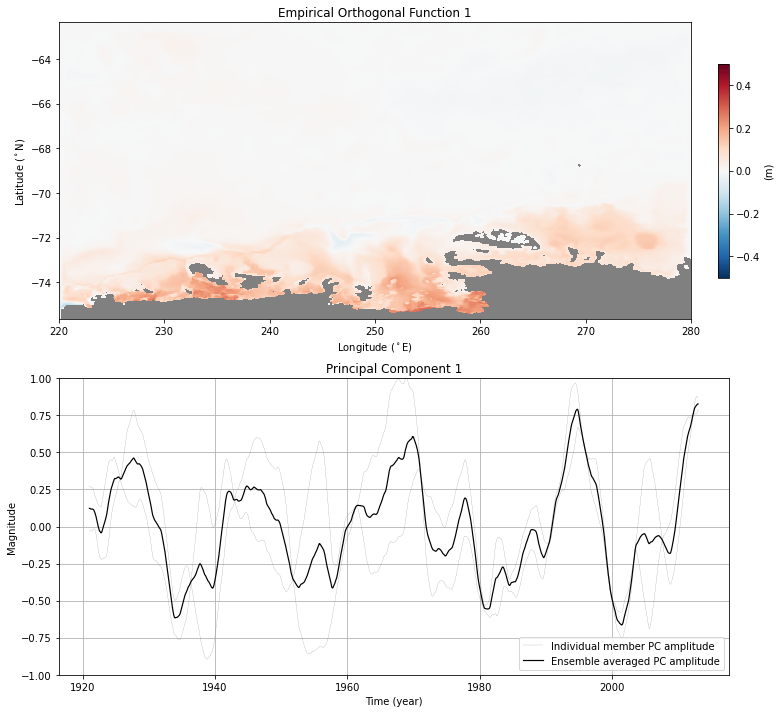

posx and posy should be finite values


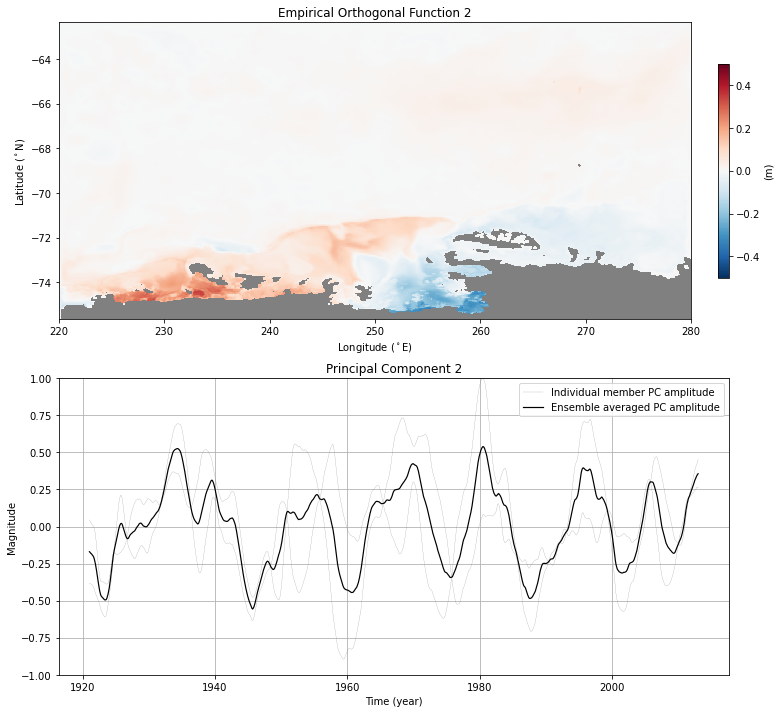

posx and posy should be finite values


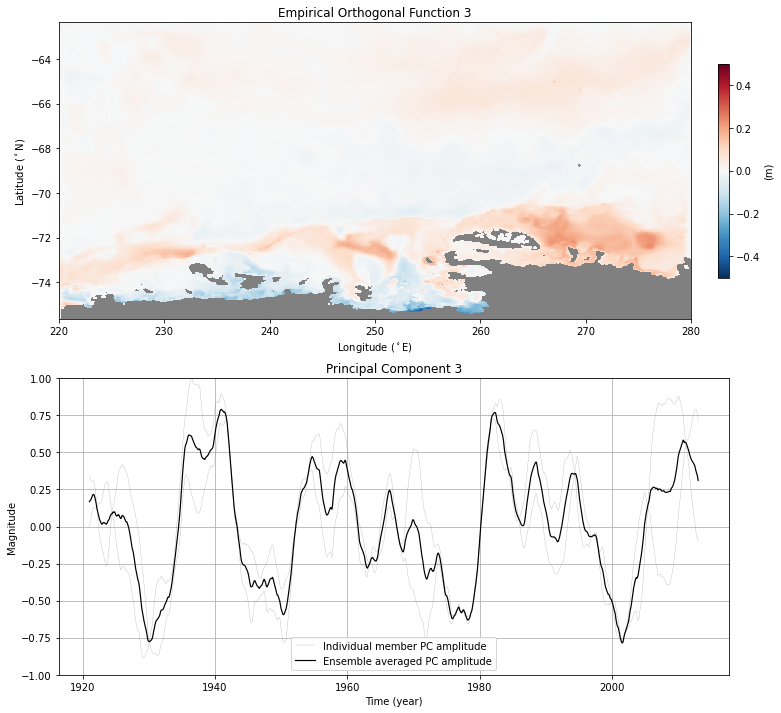

posx and posy should be finite values


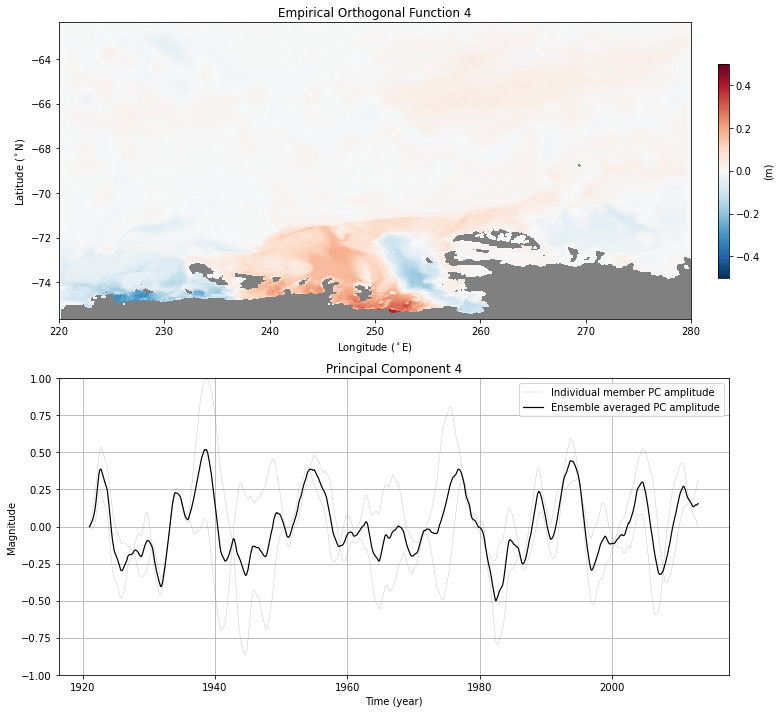

posx and posy should be finite values


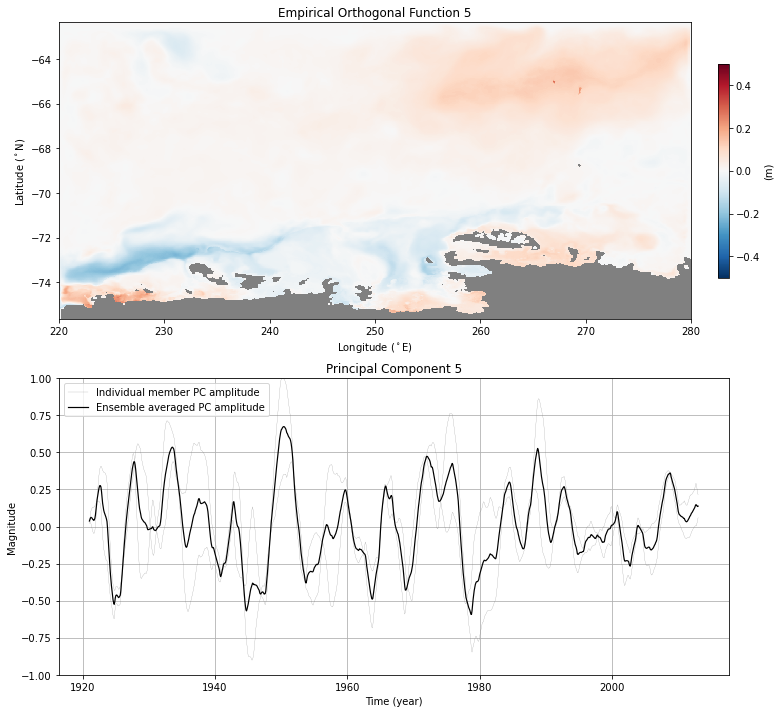

posx and posy should be finite values


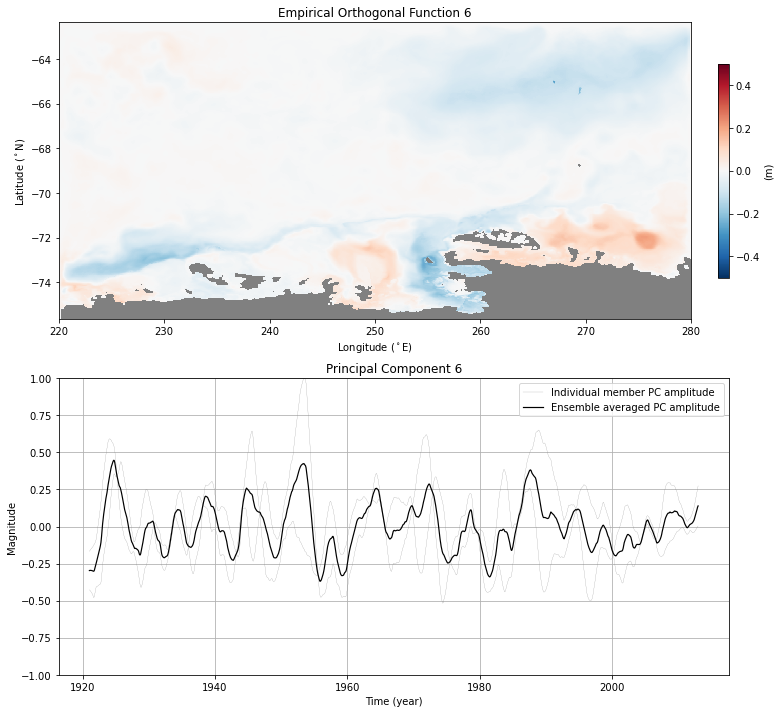

posx and posy should be finite values


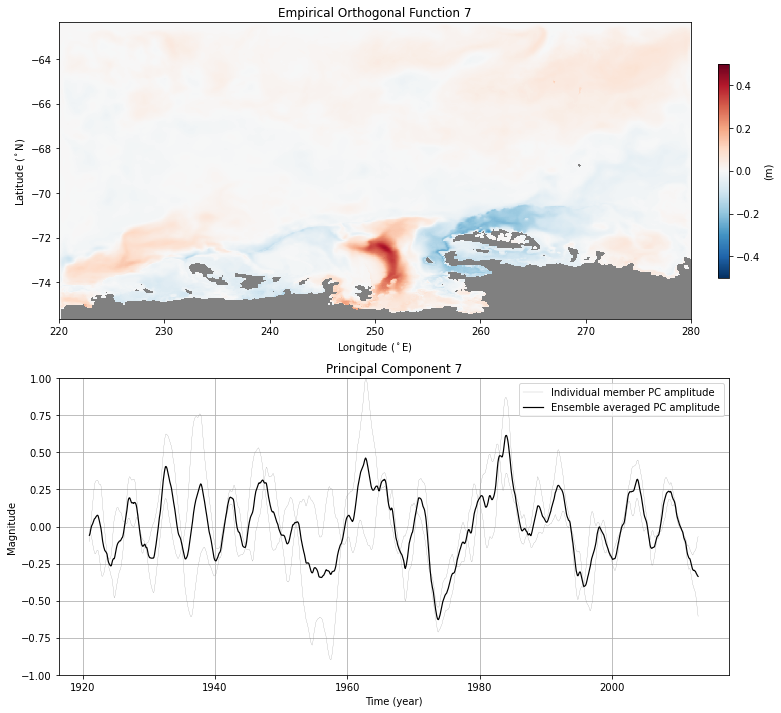

posx and posy should be finite values


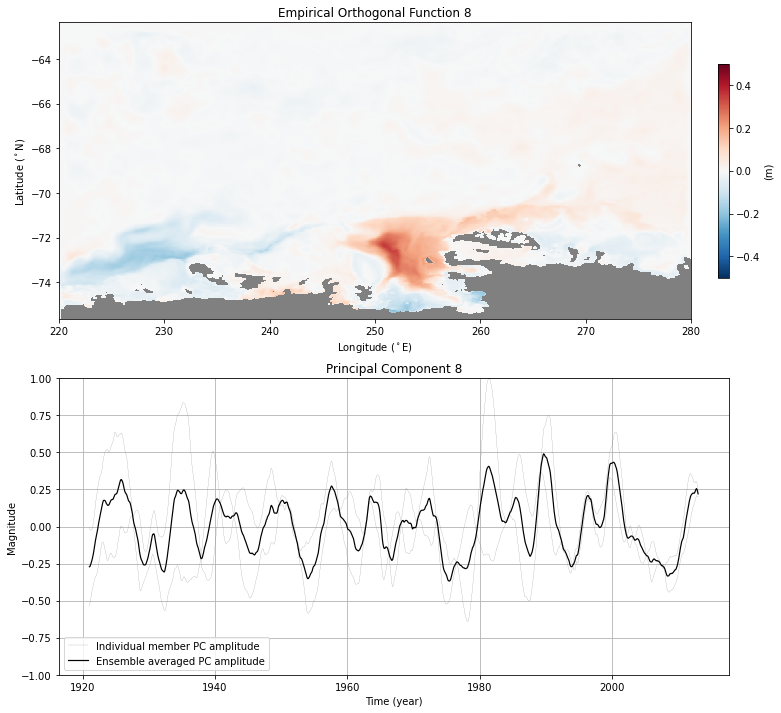

posx and posy should be finite values


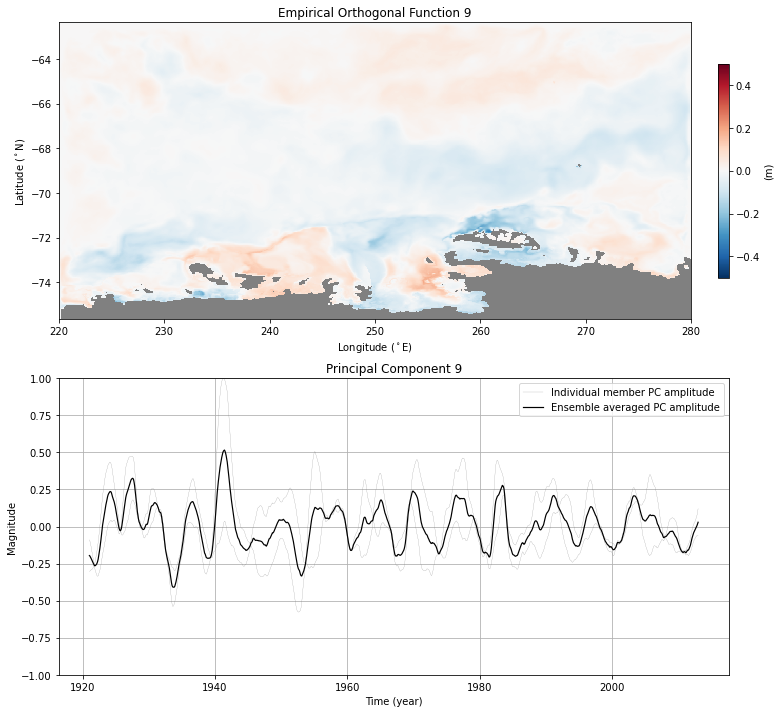

posx and posy should be finite values


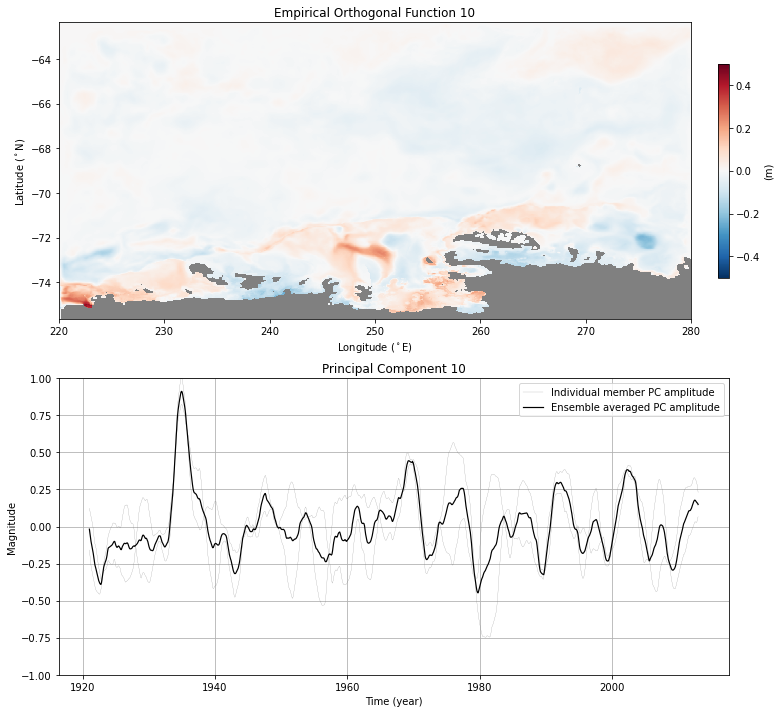

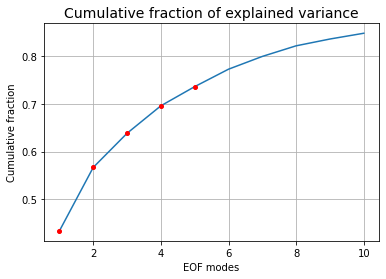

Variance contained in first 10 EOFs:  0.85


In [42]:
def performPCA(data, var, method='all', interest=10, filepath='./figures/', filename=''):
    import sklearn.decomposition as pca
    from scipy import signal
    from numpy import ma
    
    data=data.drop_isel(time=np.where(np.isnan(data.values[0,:,150,150]))[0])
    
    if method=='ens_mean':
        data=data.mean(dim='ens')
        tc=data.indexes['time'].to_datetimeindex()
    elif method=='all':
        data['time']=data.indexes['time'].to_datetimeindex()
        tc=data.time
        dims=[len(data.ens), len(data.time)]
        data=data.stack(ens_time=['ens', 'time'])
        data=data.transpose("ens_time", "YC", "XC")
        
        
    sla=data.values
    lat=data.YC
    lon=data.XC
    
    print(np.shape(sla))
    
    #---------------------------------------------------------------------------------------------------------------------------
    #PERFORM PCA

    #Reshape the grid to one column with position and row corresponding to time
    X = np.reshape(sla, (sla.shape[0], len(lat) * len(lon)), order='F')
    #Create Boolean array corresponding to ocean indices and mask the array where there is land
    X = ma.masked_array(X, np.isnan(X))
    land = X.sum(0).mask
    X[:,land]=0
    total_modes = 10
    EOF_recons = np.ones((total_modes, len(lat) * len(lon))) * -999.

    #Perform PCA and take the EOFs and corersponding Pcs
    skpca = pca.PCA(total_modes)
    skpca.fit(X)
    PCs = skpca.transform(X)
    EOFs = skpca.components_
    #Reconstruct the EOF fields into gridded data EOF_recons =
    np.ones((total_modes, len(lat) * len(lon))) * -999.
    for i in range(total_modes):
        EOF_recons[i,:] = EOFs[i,:]
    EOF_recons = ma.masked_values(np.reshape(EOF_recons, (total_modes, len(lat), len(lon)), order='F'), -999.)
    print(EOF_recons.shape)
    
    
    #---------------------------------------------------------------------------------------------------------------------------
    #VISUALIZE
    
    ### plot loadings and scores
    from matplotlib.colors import Normalize
    import matplotlib.colors as colors

    divnorm = colors.TwoSlopeNorm(vmin=-0.4, vmax=0.4, vcenter=0)

    
    for j in range(0,interest):
        #norm = MidpointNormalize(midpoint=0)
        #Plot principal components
        fig, ax = plt.subplots(2,1,figsize=(12,12))
        EOF_recons[j,:,:][EOF_recons[j,:,:]==0]=np.nan
        #im = ax[0].imshow(np.flip(EOF_recons[j,:,:]*max(abs(PCs[j,:])), axis=0), norm=divnorm,
        #cmap=plt.cm.RdBu_r, interpolation='none',extent=[lon[0],lon[-
        #1],lat[0],lat[-1]])
        im = ax[0].pcolor(lon, lat, EOF_recons[j,:,:]*max(abs(PCs[j,:])), norm=divnorm,
        cmap=plt.cm.RdBu_r)

        ax[0].set_facecolor('grey')
        cbar=plt.colorbar(im, fraction=0.016, pad=0.04, ax=ax[0])
        cbar.set_label('(m)')
        ax[0].set_xlabel(r'Longitude ($^\circ$E)')
        ax[0].set_ylabel(r'Latitude ($^\circ$N)')

        eof=j+1
        ax[0].set_title(r'Empirical Orthogonal Function %i' % eof)
        PCnor=PCs[:,j]/max(abs(PCs[:,j]))
        
        if method=='all':
            PCnor=PCnor.reshape(dims[0], dims[1])
            for k in range(dims[0]):
                if k==0:
                    ax[1].plot(tc,PCnor[k,:], c='grey', linewidth=0.2, label='Individual member PC amplitude')
                else:
                     ax[1].plot(tc,PCnor[k,:], c='grey', linewidth=0.2)
            ax[1].plot(tc,np.mean(PCnor, axis=0), c='black', linewidth=1.2, label='Ensemble averaged PC amplitude')
        else:
            ax[1].plot(tc, PCnor, label='PC')
        #ax[1].plot(tc, (mean-mean.mean())/max(abs(mean-mean.mean())), label='Shelf Mean: corr:{}'.format(str(np.corrcoef(mean, PCnor)[0,1])))
        ax[1].grid()
        ax[1].set_title('Principal Component %i' % eof)
        ax[1].set_xlabel('Time (year)')
        ax[1].set_ylabel('Magnitude')
        #ax[1].set_xlim([tc[0],tc[-1]])
        ax[1].set_ylim([-1,1])
        ax[1].legend()
        
        from datetime import date
        today = date.today()
        today=today.strftime("%Y%m%d")
        
        plt.savefig(filepath+today+'_'+var+"_PCA_component_"+str(eof)+'_'+method+'_'+filename+".png", bbox_inches='tight')
        plt.show()
    
    variance=skpca.explained_variance_ratio_
    variancecumsum=np.cumsum(variance)
    eofnumber=np.arange(1,len(variance)+1)

    f, ax = plt.subplots(figsize=(6,4))
    ax.plot(eofnumber,variancecumsum)
    ax.plot(eofnumber[0:5],variancecumsum[0:5],'ro',markersize=4)
    ax.set_xlabel('EOF modes')
    ax.set_ylabel('Cumulative fraction')
    ax.set_title("Cumulative fraction of explained variance",
    fontsize=14)
    ax.grid()
    #ax.set_xlim([-1,313])
    #ax.set_xticks([1,50,100,150,200,250,300])
    plt.savefig(filepath+today+'_'+var+"cumulativefraction"+method+'_'+filename+".png", bbox_inches='tight')
    plt.show()
    print("Variance contained in first 10 EOFs: % .2f" %
    variancecumsum[9])
    
    np.save('./data/'+today+'_'+var+"_PCA_component"+method+'_'+filename+".npy", PCs)
    
    return PCs, tc
    
PCs, tc=performPCA(data=data_dt, var=var, method='all', interest=10, filepath='./figures/', filename='test') 

In [4]:
#Reading the data.
full='/data/hpcdata/users/grejan/mitgcm/data'
total={}
units={}
longnames={}
total, units, longnames=fc.read_all_data(full, total, units, longnames, kind='isotherm')
total, units, longnames=fc.read_all_data(full, total, units, longnames, kind='final')
total, units, longnames=fc.read_all_data(full, total, units, longnames, kind='ohc')

In [4]:
def plotPCACorrs(PCs, total, real_var, data_dt, 
                 var_list=['amundsen_shelf_break_uwind_avg', 'amundsen_shelf_temp_btw_200_700m', 'amundsen_shelf_ohc_below_0m', 'dotson_to_cosgrove_massloss'], interest=10, 
                 filename='', filepath='./figures/', method='all'):
    #from scipy import signal
    #print(cors)
    #plt.figure(figsize=(15,10))
    fig, ax=plt.subplots(len(var_list), 2, figsize=(15,10))
    
    for i, var in enumerate(var_list):
        total[var] = total[var].reindex(sorted(total[var].columns), axis=1)
        ts=total[var]['1920':'2013']
        ts=ts.rolling(24,center=True).mean()-ts.rolling(25*12, min_periods=5*12, center=True).mean()
        ts=ts.iloc[12:-11]
        #mean=ts.to_numpy().T.flatten()
        print(np.shape(ts))
        
        if method=='ens_mean':
            ts=ts.mean(axis=1)
            cors=np.zeros(interest)
            optlag=np.zeros(interest)
        else:
            #print(len(mean))
            cors=np.zeros((len(list(ts)), interest))
            optlag=np.zeros((len(list(ts)), interest))
        laglim=np.arange(-25, 26)
        for j in range(0,interest):
            PCnor=PCs[:,j]/max(abs(PCs[:,j]))
            
            if method=='ens_mean':
                lagcoef=np.zeros(len(laglim))
                for k, l in enumerate(laglim):
                    l=int(l)
                    if l<0: #ts is leading
                        lagcoef[k]=np.corrcoef(ts.iloc[:-abs(l)], PCnor[abs(l):])[0,1]
                    elif l>0: #PCnor is leading
                        lagcoef[k]=np.corrcoef(ts.iloc[abs(l):], PCnor[:-abs(l)])[0,1]
                    elif l==0: #ts is leading
                        lagcoef[k]=np.corrcoef(ts.iloc[:], PCnor[:])[0,1]
                optlag[j]=laglim[np.argmax(abs(lagcoef))]
                l=int(optlag[j])
                if l<0: #ts is leading
                    cors[j]=np.corrcoef(ts.iloc[:-abs(l)], PCnor[abs(l):])[0,1]
                elif l>0: #PCnor is leading
                    cors[j]=np.corrcoef(ts.iloc[abs(l):], PCnor[:-abs(l)])[0,1]
                elif l==0: #ts is leading
                    cors[j]=np.corrcoef(ts.iloc[:], PCnor[:])[0,1]
            elif method=='all':
                PCnor=PCnor.reshape(len(list(ts)), int(len(PCnor)/len(list(ts))))
                for ens in range(len(list(ts))):
                    lagcoef=np.zeros(len(laglim))
                    for k, l in enumerate(laglim):
                        l=int(l)
                        if l<0: #ts is leading
                            lagcoef[k]=np.corrcoef(ts.iloc[:-abs(l),ens], PCnor[ens,abs(l):])[0,1]
                        elif l>0: #PCnor is leading
                            lagcoef[k]=np.corrcoef(ts.iloc[abs(l):,ens], PCnor[ens,:-abs(l)])[0,1]
                        elif l==0: #ts is leading
                            lagcoef[k]=np.corrcoef(ts.iloc[:,ens], PCnor[ens,:])[0,1]
                    optlag[ens, j]=laglim[np.argmax(abs(lagcoef))]
                    l=int(optlag[ens, j])
                    if l<0: #ts is leading
                        cors[ens, j]=np.corrcoef(ts.iloc[:-abs(l),ens], PCnor[ens,abs(l):])[0,1]
                    elif l>0: #PCnor is leading
                        cors[ens, j]=np.corrcoef(ts.iloc[abs(l):,ens], PCnor[ens,:-abs(l)])[0,1]
                    elif l==0: #ts is leading
                        cors[ens, j]=np.corrcoef(ts.iloc[:,ens], PCnor[ens,:])[0,1]
                
                #cors[ens, j]=np.corrcoef(ts.iloc[:,ens].shift(int(optlag[ens, j])), PCnor[ens,:])[0,1]
                #print(cors[ens, j])
            
#             correlation = signal.correlate(mean, PCnor, mode="full")
            
#             for l in laglim:
#                 cors[j]=np.corrcoef(mean, PCnor)[0,1]
            
#             optlag[j] = lags[np.argmax(correlation)]
#             cors[j]=np.corrcoef(mean, PCnor)[0,1]
            
            
        if method=='all':
        #plt.subplot(len(var_list),1,i+1)
            ax[i,0].errorbar(range(1,interest+1), np.mean(cors, axis=0), yerr=np.std(cors, axis=0), 
                                 fmt='o-',  label='Ensemble Mean Pearson r')
            ax[i,0].plot(range(1,interest+1), abs(np.mean(cors, axis=0)), 'o-', label='Absolute values')
        else:
            ax[i,0].plot(range(1,interest+1), cors, 
                             'o-',  label='Ensemble Mean Pearson r')
            ax[i,0].plot(range(1,interest+1), abs(cors), 'o-', label='Absolute values')
        #ax[i,0].plot(range(1,interest+1), )
        
        
        #plt.yticks([-1,0,1])
        ax[i,0].grid(True)
        if i==0:
            fig.legend()
        ax[i,0].set_ylabel('Pearson R')
        ax[i,0].set_xlabel('Principal Component #')
        ax[i,0].set_title('Correlation between: \n '+var+' and PCs from '+real_var)
        if method=='all':
            ax[i,1].errorbar(range(1,interest+1), np.mean(optlag, axis=0), yerr=np.std(optlag, axis=0), 
                                 fmt='o-',  label='Optimal lag')
        else:
            ax[i,1].plot(range(1,interest+1), optlag, 
                                 'o-',  label='Optimal lag')
        ax[i,1].grid(True)
        ax[i,1].legend()
        ax[i,1].set_ylabel('Lag [months] \n (positive=PC leading)')
        ax[i,1].set_xlabel('Principal Component #')
        ax[i,1].set_title('Optimal lag between: \n '+var+' and PCs from '+real_var)
        
        
        
    from datetime import date
    today = date.today()
    today=today.strftime("%Y%m%d")
    
    plt.subplots_adjust(hspace=1)
    plt.savefig(filepath+today+"_PCAcorrs_"+real_var+'_'+filename+".png", bbox_inches='tight')
    
    return

PCs=np.load('./data/20220318_THETA_PCA_componentall_full_ensemble.npy')
plotPCACorrs(PCs=PCs, total=total, real_var=var, filename='full_ensemble', data_dt='does this even matter?')


NameError: name 'total' is not defined

ens02
ens03


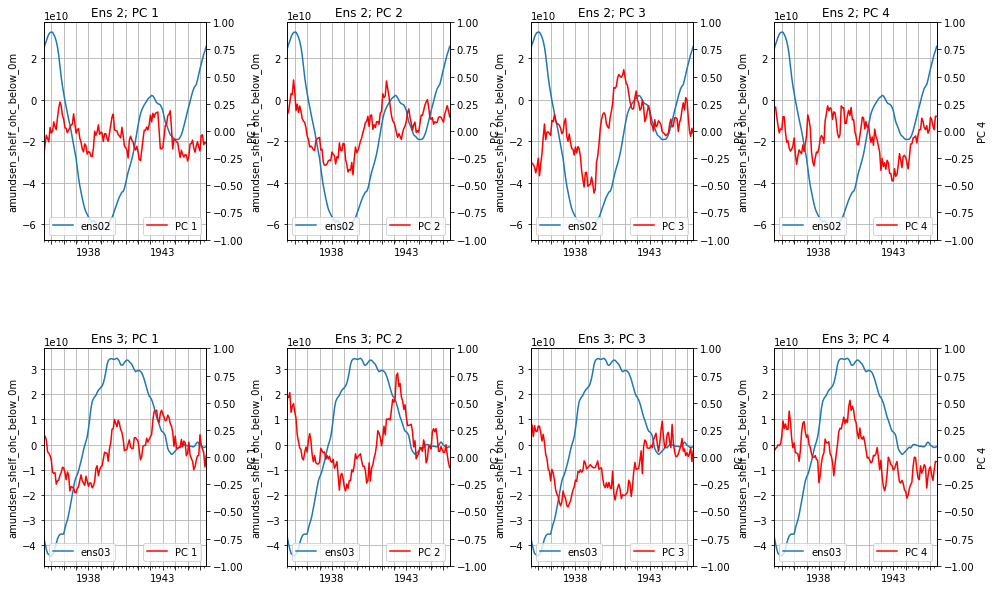

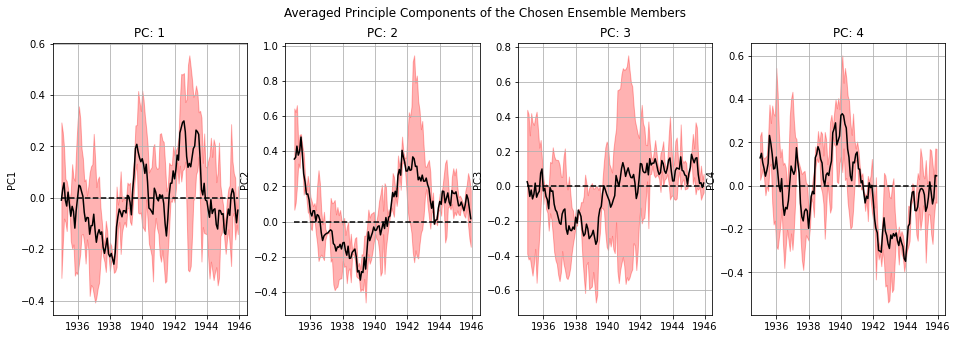

In [14]:
def showPCsforEvent(PCs, total, real_var, data_dt, 
                    var='amundsen_shelf_ohc_below_0m', ensinterest=[1], 
                    PCinterest=[1,2,3,4], filename='', filepath='./figures/', 
                    years=[1935, 1945], method='all'):
    total[var] = total[var].reindex(sorted(total[var].columns), axis=1)
    
    import pandas as pd
    import matplotlib.dates as mdates
    
    PCinterest=[k-1 for k in PCinterest]
    ensinterest=[k-1 for k in ensinterest]
    
    fig, ax=plt.subplots(len(ensinterest), len(PCinterest), figsize=(int(4*len(PCinterest)),int(5*len(ensinterest))))
    
    for i, k in enumerate(ensinterest):
        if method=='all':
            ts=total[var].iloc[:,k]['1920':'2013']
        elif method=='ens_mean':
            ts=total[var].mean(axis=1)['1920':'2013']
        elif method=='internal_variability':
            ts=total[var].iloc[:,k]['1920':'2013']-total[var].mean(axis=1)['1920':'2013']
            
        print(ts.name)
        ts=ts.rolling(24,center=True).mean()-ts.rolling(25*12, min_periods=5*12, center=True).mean()
        ts=ts[12:-11]
        
        for j, p in enumerate(PCinterest):
            PCnor=PCs[:,p]/max(abs(PCs[:,p]))
            if method!='ens_mean':
                PCnor=PCnor.reshape(len(list(total[var])), int(len(PCnor)/len(list(total[var]))))
                PCseries=pd.Series(PCnor[k,:], index=ts.index)
            else:
                PCseries=pd.Series(PCnor, index=ts.index)
            ts[str(years[0]):str(years[-1])].plot(ax=ax[i,j])
            
            ax[i,j].grid(True)
            
            ax[i,j].set_title('Ens '+str(k+1)+'; PC '+str(p+1))
            ax1=ax[i,j].twinx()
            PCseries[str(years[0]):str(years[-1])].plot(ax=ax1, c='r', label='PC '+str(p+1))
            
            ax[i,j].xaxis.set_major_locator(mdates.DayLocator(interval=10))
            ax[i,j].set_ylabel(var)
            ax1.set_ylabel('PC '+str(p+1))
            ax[i,j].legend(loc='lower left')
            ax1.legend(loc='lower right')
            ax1.set_ylim([-1, 1])
    
    from datetime import date
    today = date.today()
    today=today.strftime("%Y%m%d")
    plt.subplots_adjust(hspace=0.5, wspace=0.5)
    plt.savefig(filepath+today+"_PCAtimeseries_"+real_var+'_'+filename+'_'+str(years[0])+'-'+str(years[-1])+".png", bbox_inches='tight')
    
    if method!='ens_mean':
        plt.figure(figsize=(int(4*len(PCinterest)), 5))
        for j, p in enumerate(PCinterest):
            plt.subplot(1,len(PCinterest), j+1)
            PCnor=PCs[:,p]/max(abs(PCs[:,p]))
            PCnor=PCnor.reshape(len(list(total[var])), int(len(PCnor)/len(list(total[var]))))
            PCdf=pd.DataFrame()
            for i, k in enumerate(ensinterest):
                PCdf[k+1]=pd.Series(PCnor[k,:], index=ts.index)
            plt.subplot(1,len(PCinterest), j+1)
            plt.plot(PCdf[str(years[0]):str(years[-1])].index, PCdf[str(years[0]):str(years[-1])].mean(axis=1), c='k')
            plt.fill_between(PCdf[str(years[0]):str(years[-1])].index, 
                             PCdf[str(years[0]):str(years[-1])].mean(axis=1)-PCdf[str(years[0]):str(years[-1])].std(axis=1), 
                             PCdf[str(years[0]):str(years[-1])].mean(axis=1)+PCdf[str(years[0]):str(years[-1])].std(axis=1), alpha=0.3, color='red')
            plt.plot(PCdf[str(years[0]):str(years[-1])].index, np.zeros(len(PCdf[str(years[0]):str(years[-1])].index)), 'k--')
            plt.title('PC: '+str(p+1))
            plt.ylabel('PC'+str(p+1))
            plt.grid(True)

        plt.suptitle('Averaged Principle Components of the Chosen Ensemble Members')
        
    return
    
real_var='THETA'
showPCsforEvent(PCs, total, real_var, data_dt='pureBS', 
                    var='amundsen_shelf_ohc_below_0m', ensinterest=[2,3], 
                    PCinterest=[1,2,3,4], filename='test', filepath='./figures/', 
                    years=[1935, 1945], method='all')

(1105, 20)
(1105, 20)
(1105, 20)
(1105, 20)


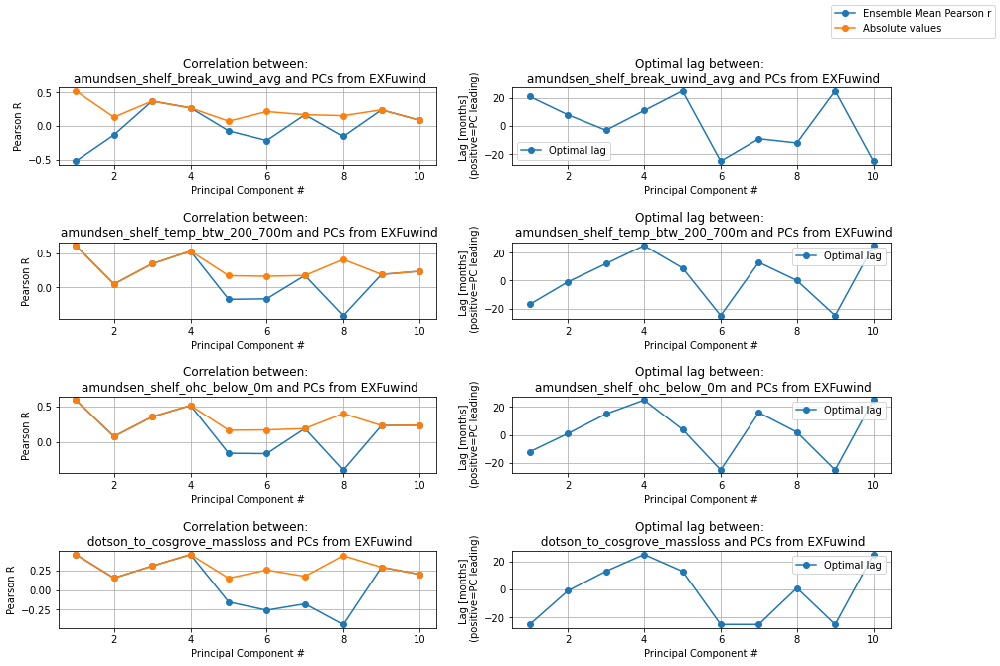

In [54]:
PCs=np.load('./data/20220321_EXFuwind_PCA_componentens_mean_ensemble_mean_cumsum.npy')
PCs=PCs[12:-11,:]
var='EXFuwind'
plotPCACorrs(PCs=PCs, total=total, real_var=var, filename='ensemble_mean_cumsum', method='ens_mean', data_dt='does this even matter?')

(1105, 20)
(1105, 20)
(1105, 20)
(1105, 20)


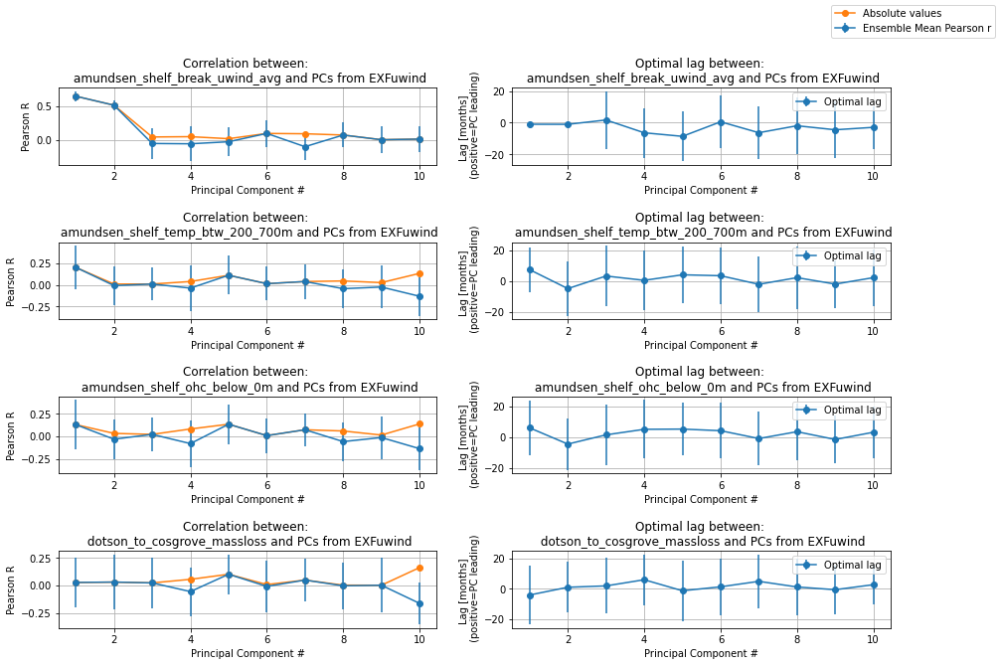

In [53]:
PCs=np.load('./data/20220321_EXFuwind_PCA_componentall_internal_variability.npy')
var='EXFuwind'
#print(np.shape(PCs))
plotPCACorrs(PCs=PCs, total=total, real_var=var, filename='internal_variability', data_dt='does this even matter?')

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None


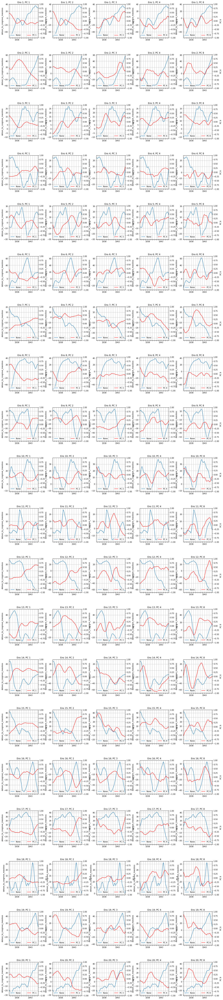

In [115]:
showPCsforEvent(PCs, total, real_var, data_dt='pureBS', 
                    var='dotson_to_cosgrove_massloss', ensinterest=np.arange(1, 20+1), 
                    PCinterest=[1,2,3,4, 8], filename='internal_variability', filepath='./figures/', 
                    years=[1935, 1945], method='internal_variability')

In [25]:
PCs[:,0].reshape(20, int(len(PCs[:,0])/20))[0,:]

array([23.75346869, 23.76775608, 23.5495623 , ..., 63.9305379 ,
       64.94677217, 65.60639243])

In [33]:
PCs=np.load('./data/20220318_THETA_PCA_componentens_mean_ensemble_mean.npy')
plotPCACorrs(PCs=PCs, total=total, real_var=var, filename='ensemble_mean', data_dt='does this even matter?', method='ens_mean')

FileNotFoundError: [Errno 2] No such file or directory: './data/20220318_THETA_PCA_componentens_mean_ensemble_mean_cumsum.npy'

Text(0.5, 0.98, 'amundsen_shelf_ohc_below_0m during 1940s')

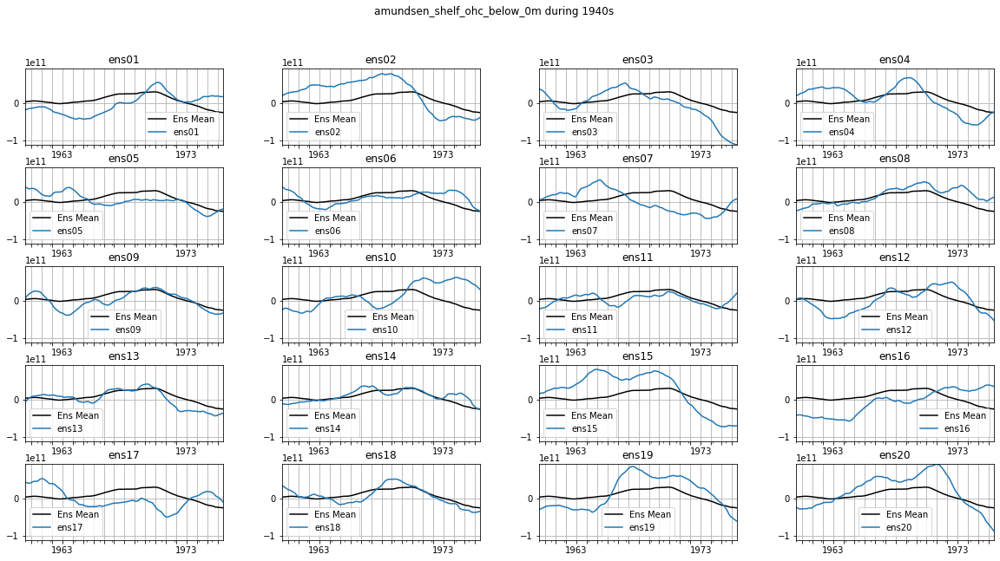

In [195]:
#Which members have strongest 1940s response?
var='amundsen_shelf_ohc_below_0m'

years=[1960, 1975]

import matplotlib.dates as mdates


fig, ax=plt.subplots(5,4,figsize=(20,10))

data=total[var].rolling(24, center=True).mean()-total[var].rolling(25*12, center=True, min_periods=5*12).mean()

for i, ens in enumerate(list(total[var])):
    data.mean(axis=1)[str(years[0]):str(years[-1])].plot(ax=ax[int(i/4), i%4], c='k', label='Ens Mean')
    data[ens][str(years[0]):str(years[-1])].plot(ax=ax[int(i/4), i%4], label=ens)
    ax[int(i/4), i%4].set_ylim([data[str(years[0]):str(years[-1])].min().min(), data[str(years[0]):str(years[-1])].max().max()])
    ax[int(i/4), i%4].legend()
    ax[int(i/4), i%4].grid(True)
    ax[int(i/4), i%4].xaxis.set_major_locator(mdates.DayLocator(interval=10))
    ax[int(i/4), i%4].set_title(ens)
fig.subplots_adjust(hspace=0.3, wspace=0.3)
fig.suptitle(var+' during 1940s')

In [197]:
print(data['1969':'1973'].sub(data['1969':'1973'].mean(axis=1), axis=0).sum().sort_values()[:5].index)
print(data['1969':'1973'].sub(data['1969':'1973'].mean(axis=1), axis=0).sum().sort_values()[-5:].index)

Index(['ens07', 'ens17', 'ens03', 'ens05', 'ens13'], dtype='object')
Index(['ens12', 'ens08', 'ens10', 'ens19', 'ens20'], dtype='object')


None
None
None
None
None


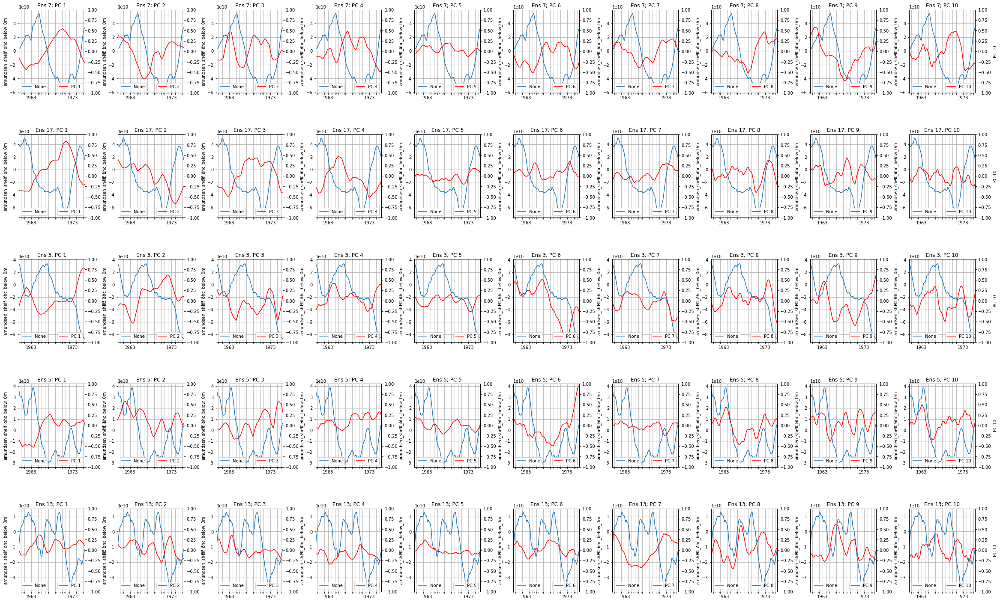

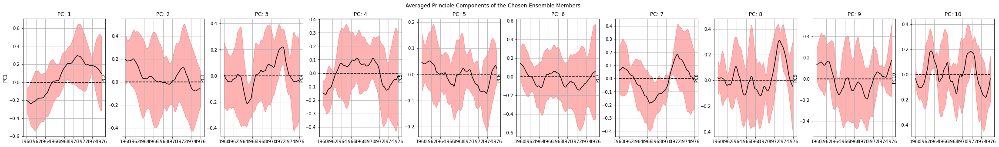

In [199]:
PCs=np.load('./data/20220318_THETA_PCA_componentall_internal_variability.npy')
showPCsforEvent(PCs, total, real_var, data_dt='pureBS', 
                    var='amundsen_shelf_ohc_below_0m', ensinterest=[7,17,3,5, 13], 
                    PCinterest=np.arange(1,11), filename='internal_variability_weakest', filepath='./figures/', 
                    years=[1960, 1975], method='internal_variability')

ens01
ens02
ens03
ens04
ens05
ens06
ens07
ens08
ens09
ens10
ens11
ens12
ens13
ens14
ens15
ens16
ens17
ens18
ens19
ens20


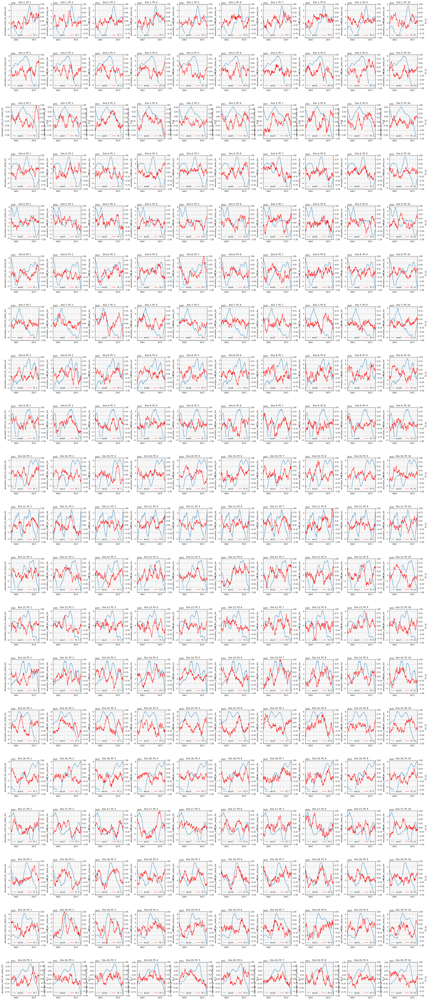

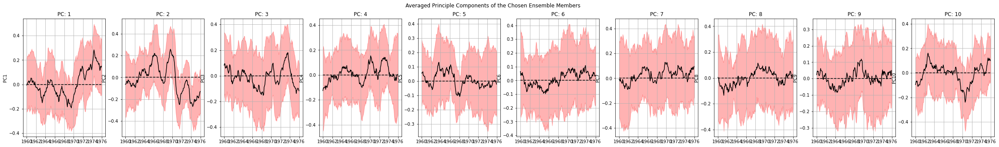

In [18]:
PCs=np.load('./data/20220321_EXFuwind_PCA_componentall_full_ensemble.npy')
showPCsforEvent(PCs, total, real_var, data_dt='pureBS', 
                    var='amundsen_shelf_ohc_below_0m', ensinterest=np.arange(1, 21), 
                    PCinterest=np.arange(1,11), filename='full_ensemble', filepath='./figures/', 
                    years=[1960, 1975], method='all')

ens01
ens02
ens03
ens04
ens05
ens06
ens07
ens08
ens09
ens10
ens11
ens12
ens13
ens14
ens15
ens16
ens17
ens18
ens19
ens20


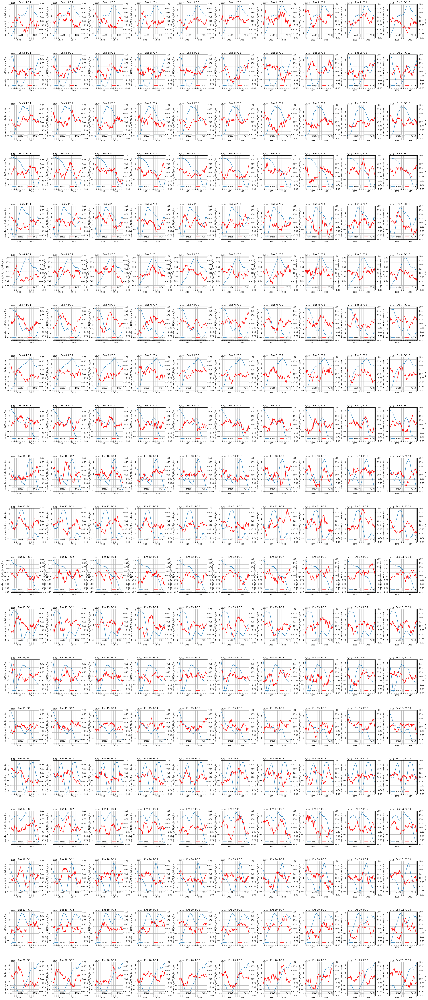

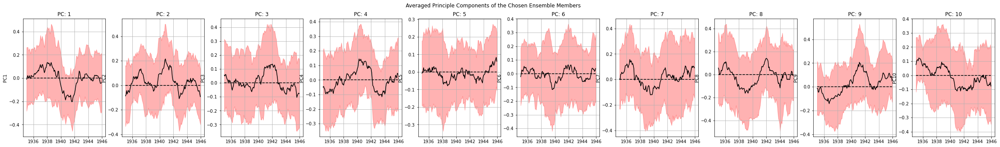

In [17]:
PCs=np.load('./data/20220321_EXFuwind_PCA_componentall_full_ensemble.npy')
showPCsforEvent(PCs, total, real_var, data_dt='pureBS', 
                    var='amundsen_shelf_ohc_below_0m', ensinterest=np.arange(1, 21), 
                    PCinterest=np.arange(1,11), filename='full_ensemble', filepath='./figures/', 
                    years=[1935, 1945], method='all')

ens01
ens02
ens03
ens04
ens05
ens06
ens07
ens08
ens09
ens10
ens11
ens12
ens13
ens14
ens15
ens16
ens17
ens18
ens19
ens20


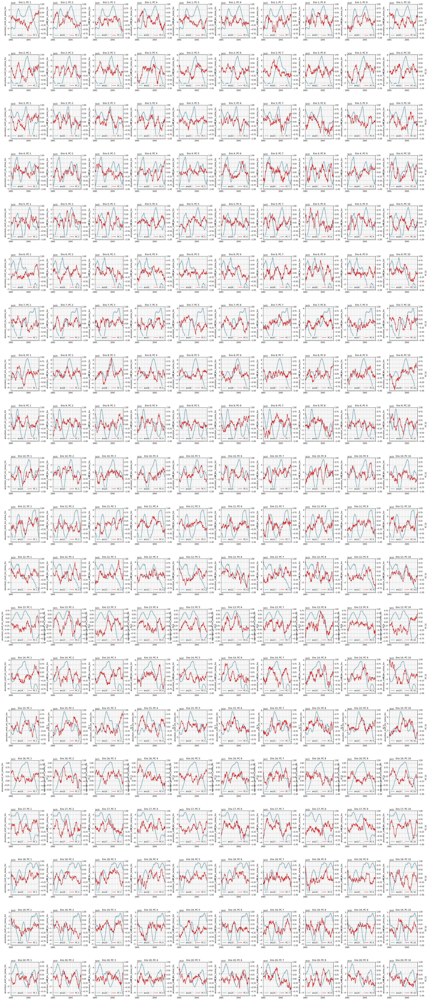

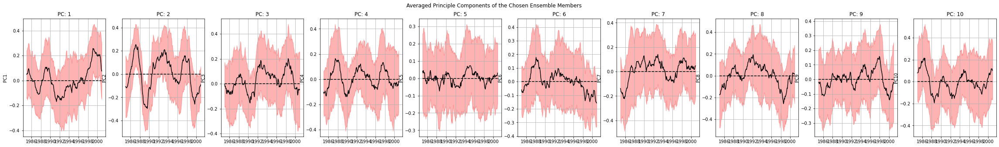

In [16]:
real_var='EXFuwind'
PCs=np.load('./data/20220321_EXFuwind_PCA_componentall_full_ensemble.npy')
showPCsforEvent(PCs, total, real_var, data_dt='pureBS', 
                    var='amundsen_shelf_ohc_below_0m', ensinterest=np.arange(1, 21), 
                    PCinterest=np.arange(1,11), filename='full_ensemble', filepath='./figures/', 
                    years=[1985, 2000], method='all')

In [ ]:
PCs=np.load('./data/20220321_EXFuwind_PCA_componentens_mean_ensemble_mean_cumsum.npy')
PCs=PCs[12:-11, :]
showPCsforEvent(PCs, total, real_var, data_dt='pureBS', 
                    var='amundsen_shelf_ohc_below_0m', ensinterest=[7,3], 
                    PCinterest=np.arange(1,11), filename='ens_mean_cumsum', filepath='./figures/', 
                    years=[1985, 2000], method='ens_mean')

None
None


None
None


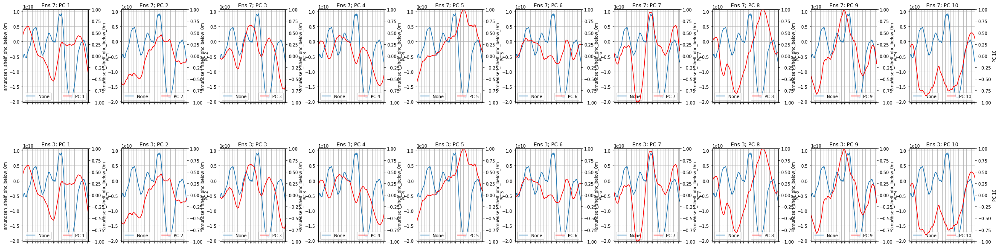

In [56]:
PCs=np.load('./data/20220321_EXFuwind_PCA_componentens_mean_ensemble_mean_cumsum.npy')
PCs=PCs[12:-11, :]
showPCsforEvent(PCs, total, real_var, data_dt='pureBS', 
                    var='amundsen_shelf_ohc_below_0m', ensinterest=[7,3], 
                    PCinterest=np.arange(1,11), filename='ens_mean_cumsum', filepath='./figures/', 
                    years=[1930, 1950], method='ens_mean')

None
None


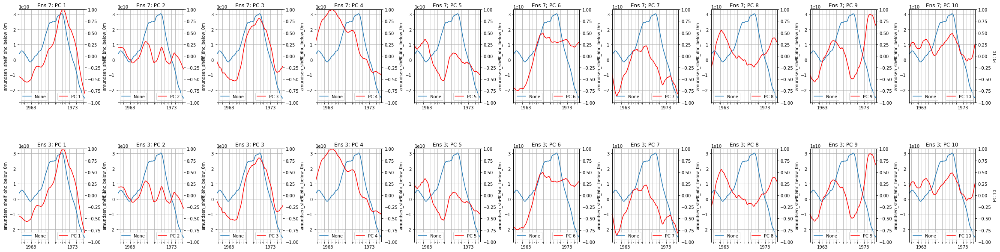

In [58]:
PCs=np.load('./data/20220321_EXFuwind_PCA_componentens_mean_ensemble_mean_cumsum.npy')
PCs=PCs[12:-11, :]
showPCsforEvent(PCs, total, real_var, data_dt='pureBS', 
                    var='amundsen_shelf_ohc_below_0m', ensinterest=[7,3], 
                    PCinterest=np.arange(1,11), filename='ens_mean_cumsum', filepath='./figures/', 
                    years=[1960, 1975], method='ens_mean')

<AxesSubplot:>

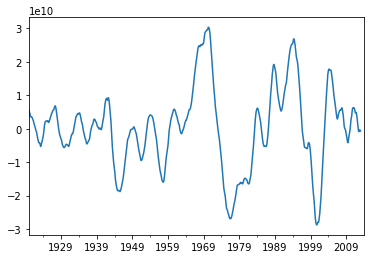

In [28]:
(total['amundsen_shelf_ohc_below_0m'].mean(axis=1).rolling(24, center=True).mean()-total['amundsen_shelf_ohc_below_0m'].mean(axis=1).rolling(25*12, center=True, min_periods=5*12).mean())['1920':'2013'].plot()

<AxesSubplot:>

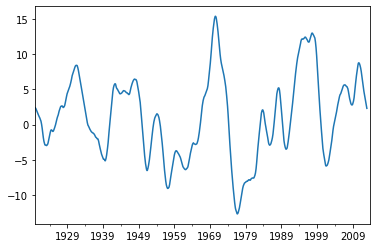

In [31]:
(total['amundsen_shelf_break_uwind_avg'].mean(axis=1).rolling(24, center=True).mean()-total['amundsen_shelf_break_uwind_avg'].mean(axis=1).rolling(25*12, center=True, min_periods=5*12).mean()).cumsum()['1920':'2013'].plot()

<AxesSubplot:>

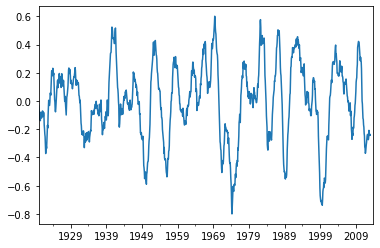

In [32]:
(total['amundsen_shelf_break_uwind_avg'].mean(axis=1).rolling(24, center=True).mean()-total['amundsen_shelf_break_uwind_avg'].mean(axis=1).rolling(25*12, center=True, min_periods=5*12).mean())['1920':'2013'].plot()

In [36]:
a=(total['amundsen_shelf_break_uwind_avg'].mean(axis=1).rolling(24, center=True).mean()-total['amundsen_shelf_break_uwind_avg'].mean(axis=1).rolling(25*12, center=True, min_periods=5*12).mean())

In [43]:
PCs=np.load('./data/20220321_EXFuwind_PCA_componentens_mean_ensemble_mean_cumsum.npy')

In [44]:
PCs1=np.load('./data/20220321_EXFuwind_PCA_componentens_mean_ensemble_mean.npy')

In [45]:
np.shape(PCs)

(1128, 10)

In [46]:
np.shape(PCs1)

(1105, 10)

<AxesSubplot:>

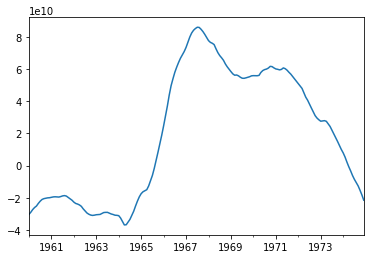

In [16]:
(total['amundsen_shelf_ohc_below_0m'].rolling(24, center=True).mean()-total['amundsen_shelf_ohc_below_0m'].rolling(25*12, min_periods=5*12, center=True).mean())['1960':'1974']['ens19'].plot()#.sum().sort_values()